[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLOv12 Object Detection on a Custom Dataset

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolov12-object-detection-model.ipynb)
[![arXiv](https://img.shields.io/badge/arXiv-2502.12524-b31b1b.svg)](https://arxiv.org/abs/2502.12524)
[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/train-yolov12-model)
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/sunsmarterjie/yolov12)

[YOLOv12](https://github.com/sunsmarterjie/yolov12) is a newly proposed attention-centric variant of the YOLO family that focuses on incorporating efficient attention mechanisms into the backbone while preserving real-time performance. Instead of relying heavily on CNN-based architectures like its predecessors, YOLOv12 introduces a simple yet powerful “area attention” module, which strategically partitions the feature map to reduce the quadratic complexity of full self-attention. It also adopts residual efficient layer aggregation networks (R-ELAN) to enhance feature aggregation and training stability, especially for larger models. These innovations, together with refinements such as scaled residual connections and a reduced MLP ratio, enable YOLOv12 to harness the benefits of attention (e.g., better global context modeling) without sacrificing speed.

![yolov12-area-attention](https://media.roboflow.com/notebooks/examples/yolov12-area-attention.png)

Compared to prior YOLO iterations (e.g., YOLOv10, YOLOv11, and YOLOv8), YOLOv12 achieves higher detection accuracy with competitive or faster inference times across all model scales. Its five sizes—N, S, M, L, and X—range from 2.6M to 59.1M parameters, striking a strong accuracy–speed balance. For instance, the smallest YOLOv12-N surpasses other “nano” models by over 1% mAP with latency around 1.6 ms on a T4 GPU, and the largest YOLOv12-X achieves 55.2% mAP, comfortably outscoring comparable real-time detectors such as RT-DETR and YOLOv11-X . By matching or exceeding state-of-the-art accuracy while remaining fast, YOLOv12 represents a notable step forward for attention-based real-time object detection.

![yolov12-metrics](https://storage.googleapis.com/com-roboflow-marketing/notebooks/examples/yolov12-metrics.png)

## Environment setup

### Configure your API keys

To fine-tune YOLOv12, you need to provide your Roboflow API key. Follow these steps:

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

In [ ]:
import os
from google.colab import userdata

os.environ["ROBOFLOW_API_KEY"] = userdata.get("ROBOFLOW_API_KEY")

### Check GPU availability

**NOTE:** **YOLOv12 leverages FlashAttention to speed up attention-based computations, but this feature requires an Nvidia GPU built on the Ampere architecture or newer—for example, GPUs like the RTX 3090, RTX 3080, or even the Nvidia L4 meet this requirement.**

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


### Install dependencies

**NOTE:** Currently, YOLOv12 does not have its own PyPI package, so we install it directly from GitHub while also adding roboflow (to conveniently pull datasets from the Roboflow Universe), supervision (to visualize inference results and benchmark the model’s performance), and flash-attn (to accelerate attention-based computations via optimized CUDA kernels).

In [ ]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git roboflow supervision flash-attn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 45.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 98.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 113.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

### Download example data

Let's download an image we can use for YOLOv12 inference. Feel free to drag and drop your own images into the Files tab on the left-hand side of Google Colab, then reference their filenames in your code for a custom inference demo.

In [ ]:
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg

--2025-05-13 01:40:39--  https://media.roboflow.com/notebooks/examples/dog.jpeg
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106055 (104K) [image/jpeg]
Saving to: ‘dog.jpeg’

dog.jpeg            100%[===================>] 103.57K  --.-KB/s    in 0.002s  

2025-05-13 01:40:39 (64.6 MB/s) - ‘dog.jpeg’ saved [106055/106055]



## Run inference

In the example, we're using the `yolov12l.pt` model, but you can experiment with different model sizes by simply swapping out the model name during initialization. Options include `yolov12n.pt`, `yolov12s.pt`, `yolov12m.pt`, `yolov12l.pt`, and `yolov12x.pt`.

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/yolov12/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
FlashAttention is not available on this device. Using scaled_dot_product_attention instead.


100%|██████████| 51.4M/51.4M [00:01<00:00, 38.6MB/s]


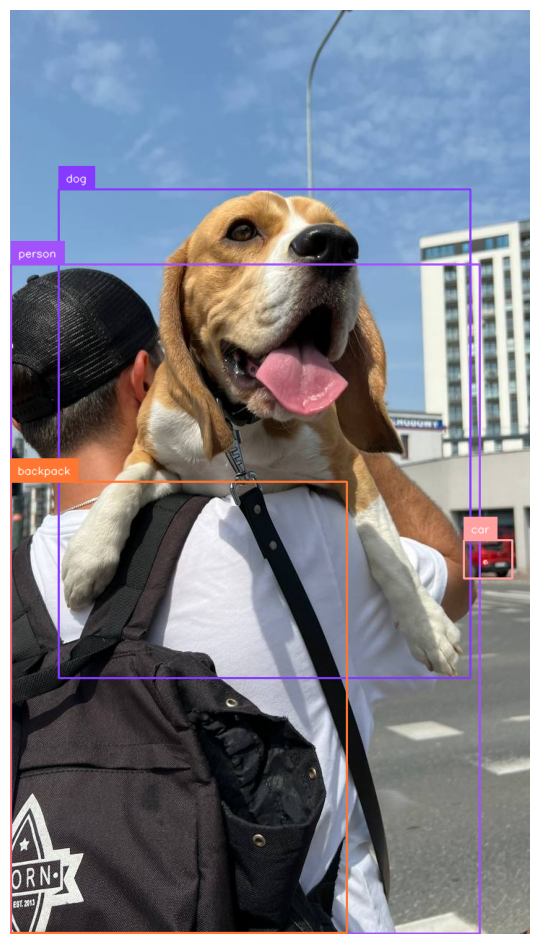

In [ ]:
import cv2
from ultralytics import YOLO
import supervision as sv


image_path = f"{HOME}/dog.jpeg"
image = cv2.imread(image_path)

model = YOLO('yolov12l.pt')

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results)

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

## Download dataset from Roboflow Universe

In [ ]:
from roboflow import download_dataset

dataset = download_dataset('https://universe.roboflow.com/josiahs-workspace/wl2-oukux/dataset/1', 'yolov8')

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to wl2-1 in yolov8:: 100%|██████████| 8624/8624 [00:01<00:00, 6600.29it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/yolov12/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
!ls {dataset.location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


**NOTE:** We need to make a few changes to our downloaded dataset so it will work with YOLOv12. Run the following bash commands to prepare your dataset for training by updating the relative paths in the `data.yaml` file, ensuring it correctly points to the subdirectories for your dataset's `train`, `test`, and `valid` subsets.

In [ ]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [ ]:
!cat {dataset.location}/data.yaml

names:
- 30C
- 40C
- 50C
- 60C
- 70C
- 95C
- DN_bleach
- DN_dry
- DN_dry_clean
- DN_iron
- DN_steam
- DN_tumble_dry
- DN_wash
- DN_wet_clean
- DN_wring
- bleach
- chlorine_bleach
- drip_dry
- drip_dry_in_shade
- dry_clean
- dry_clean_any_solvent
- dry_clean_any_solvent_except_trichloroethylene
- dry_clean_low_heat
- dry_clean_no_steam
- dry_clean_petrol_only
- dry_clean_reduced_moisture
- dry_clean_short_cycle
- dry_flat
- hand_wash
- iron
- iron_high
- iron_low
- iron_medium
- line_dry
- line_dry_in_shade
- machine_wash_delicate
- machine_wash_normal
- machine_wash_permanent_press
- natural_dry
- non_chlorine_bleach
- shade_dry
- steam
- tumble_dry_high
- tumble_dry_low
- tumble_dry_medium
- tumble_dry_no_heat
- tumble_dry_normal
- wet_clean
- wring
nc: 49
roboflow:
  license: CC BY 4.0
  project: wl2-oukux
  url: https://universe.roboflow.com/josiahs-workspace/wl2-oukux/dataset/1
  version: 1
test: ../test/images
train: ../train/images
val: ../valid/images


## Fine-tune YOLOv12 model

We are now ready to fine-tune our YOLOv12 model. In the code below, we initialize the model using a starting checkpoint—here, we use `yolov12s.yaml`, but you can replace it with any other model (e.g., `yolov12n.pt`, `yolov12m.pt`, `yolov12l.pt`, or `yolov12x.pt`) based on your preference. We set the training to run for 100 epochs in this example; however, you should adjust the number of epochs along with other hyperparameters such as batch size, image size, and augmentation settings (scale, mosaic, mixup, and copy-paste) based on your hardware capabilities and dataset size.

**Note:** **Note that after training, you might encounter a `TypeError: argument of type 'PosixPath' is not iterable error` — this is a known issue, but your model weights will still be saved, so you can safely proceed to running inference.**

In [ ]:
#optional

from ultralytics import YOLO

model = YOLO('yolov12s.pt')

results = model.predict("/content/road.m4p", save=True)

In [ ]:
#@title Select YOLO12 🚀 logger {run: 'auto'}
logger = 'TensorBoard' #@param ['TensorBoard', 'Weights & Biases']

if logger == 'TensorBoard':
  !yolo settings tensorboard=True
  %load_ext tensorboard
  %tensorboard --logdir .
elif logger == 'Weights & Biases':
  !yolo settings wandb=True

JSONDict("/root/.config/yolov12/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": false,
  "vscode_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings


<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov12m.pt')

results = model.train(data=f'{dataset.location}/data.yaml', epochs=250, batch=64, plots=True)

100%|██████████| 38.0M/38.0M [00:01<00:00, 28.7MB/s]


New https://pypi.org/project/ultralytics/8.3.131 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: task=detect, mode=train, model=yolov12m.pt, data=/content/wl2-1/data.yaml, epochs=250, time=None, patience=100, batch=64, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False

100%|██████████| 755k/755k [00:00<00:00, 107MB/s]


Overriding model.yaml nc=80 with nc=49

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     37120  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2, 1, 2]         
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    147968  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2, 1, 4]        
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  2   2664960  ultralytics.nn.modules.block.A2C2f           [512, 512, 2, True, 4]        
  7                  -1  1   2360320  ultralytic

100%|██████████| 5.26M/5.26M [00:00<00:00, 377MB/s]


AMP: checks passed ✅


train: Scanning /content/wl2-1/train/labels... 3768 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3768/3768 [00:02<00:00, 1479.80it/s]


train: New cache created: /content/wl2-1/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1170, len(boxes) = 23058. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /content/wl2-1/valid/labels... 352 images, 0 backgrounds, 0 corrupt: 100%|██████████| 352/352 [00:00<00:00, 1251.83it/s]

val: New cache created: /content/wl2-1/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 62, len(boxes) = 2262. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 131 weight(decay=0.0), 138 weight(decay=0.0005), 137 bias(decay=0.0)
TensorBoard: WARNING ⚠️ TensorBoard graph visualization failure Tracing failed sanity checks!
ERROR: Graphs differed across invocations!
	Graph diff:
		  graph(%self.1 : __torch__.ultralytics.nn.tasks.DetectionModel,
		        %x.1 : Tensor):
		    %model : __torch__.torch.nn.modules.container.Sequential = prim::GetAttr[name="model"](%self.1)
		    %_21 : __torch__.ultralytics.nn.modules.head.Detect = prim::GetAttr[name="21"](%model)
		    %model.43 : __torch__.torch.nn.modules.container.Sequential = prim::GetAttr[name="model"](%self.1)
		    %_20 : __torch__.ultralytics.nn.modules.block.C3k2 = prim::GetAttr[name="20"](%model.43)
		    %model.41 : __torch__.torc

      1/250      38.6G      1.915      3.616      1.787        394        640: 100%|██████████| 59/59 [00:34<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.08s/it]

                   all        352       2262      0.623      0.247      0.202      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/250      38.4G      1.438      1.886      1.376        530        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.15it/s]

                   all        352       2262      0.413      0.638      0.445      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/250      38.2G      1.493      1.703       1.41        484        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.14s/it]

                   all        352       2262      0.477      0.362      0.296      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/250      38.3G      1.494      1.564      1.418        572        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/3 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 8.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 2/3 [00:17<00:08,  8.93s/it]

WARNING ⚠️ NMS time limit 6.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:25<00:00,  8.42s/it]

                   all        352       2262      0.298      0.291      0.166      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/250      38.3G      1.449      1.453      1.401        557        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.15s/it]

                   all        352       2262      0.498      0.371      0.323      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/250      38.3G       1.42      1.379      1.378        363        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.28it/s]

                   all        352       2262      0.627      0.324      0.373      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/250      38.2G      1.405      1.272      1.373        450        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.04it/s]

                   all        352       2262      0.624      0.302      0.329      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/250      38.2G      1.386      1.208      1.358        551        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.35it/s]

                   all        352       2262      0.484      0.595      0.538      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/250      38.6G      1.362      1.148      1.359        578        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]

                   all        352       2262      0.524      0.695      0.596      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/250      38.2G      1.341      1.061      1.339        484        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.33it/s]

                   all        352       2262      0.503       0.69      0.617      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/250      38.4G      1.337      1.041      1.324        489        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        352       2262      0.653       0.67      0.687      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/250      38.3G      1.318     0.9793      1.332        473        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.629      0.696      0.698      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/250      38.4G      1.311     0.9532      1.311        561        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262       0.58      0.748      0.719       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/250      38.4G      1.291     0.9083      1.293        491        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.36it/s]

                   all        352       2262      0.722      0.681      0.735       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/250      38.4G      1.279      0.896      1.303        472        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.669      0.702      0.729      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/250      38.2G       1.28     0.8702      1.297        438        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262       0.71      0.686      0.733       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/250      38.2G      1.259     0.8273      1.283        586        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.669      0.631      0.672      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/250      38.4G      1.244     0.8061      1.273        527        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.742      0.749      0.785      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/250      38.4G      1.228     0.7922      1.268        525        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.36it/s]

                   all        352       2262      0.667      0.752      0.775      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/250      38.2G      1.217     0.7771      1.267        547        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.667      0.793      0.779      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/250      38.4G      1.199     0.7549      1.248        475        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.771      0.777      0.806      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/250      38.4G      1.187     0.7418       1.24        524        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        352       2262      0.709      0.786      0.815        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/250      38.4G      1.159     0.7096      1.215        569        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.819      0.746      0.808      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/250      38.4G      1.147     0.7157      1.218        493        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.677      0.771      0.775      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/250      38.5G      1.145     0.6886      1.209        581        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.769      0.779      0.821      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/250      38.2G      1.125     0.6798      1.209        448        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.707      0.827      0.803      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/250      38.2G      1.116     0.6656      1.194        547        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.794       0.79      0.823      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/250      38.4G       1.11     0.6693      1.183        535        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.734      0.789      0.831      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/250      38.3G      1.097     0.6547      1.186        494        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.657      0.824      0.808      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/250      38.4G      1.095     0.6447      1.178        654        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.764      0.799      0.851      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/250      38.4G      1.074     0.6344      1.169        463        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.764      0.814       0.84      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/250      38.9G       1.06     0.6331      1.165        505        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.777        0.8       0.84      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/250      38.6G      1.055     0.6172      1.166        447        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.737       0.83      0.855       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/250      38.5G      1.032     0.6022      1.146        538        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.794      0.809      0.844      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/250      38.2G      1.032      0.603      1.149        483        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.793      0.805      0.848      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/250      38.4G      1.019     0.5954       1.14        366        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.834      0.851      0.881       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/250      38.2G      1.019     0.5862      1.142        520        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.848      0.817      0.886      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/250      38.5G      1.013     0.5927      1.135        495        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.36it/s]

                   all        352       2262      0.849      0.798      0.853      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/250      38.4G     0.9903     0.5734      1.123        533        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.779      0.838      0.861      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/250      38.2G       0.98     0.5616      1.117        451        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.847      0.805      0.885      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/250      38.5G     0.9862     0.5658      1.121        407        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.756      0.867      0.882      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/250      38.4G     0.9703     0.5563      1.114        541        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.825       0.82      0.868      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/250      38.5G     0.9707     0.5643      1.115        497        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.794      0.825      0.885       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/250      38.4G     0.9445     0.5387      1.098        454        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.847      0.802      0.864      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/250      38.4G     0.9495      0.544      1.094        472        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.873      0.797      0.866      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/250      38.2G     0.9354      0.527      1.085        497        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.815      0.846      0.874      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/250      38.4G     0.9315     0.5399       1.09        493        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        352       2262      0.814       0.84      0.871      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/250      38.4G     0.9173     0.5268       1.08        425        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.835      0.857      0.885      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/250      38.5G     0.9209     0.5299      1.081        574        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.906      0.793      0.868      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/250      38.4G      0.912     0.5255      1.078        502        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.882      0.808      0.867      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/250      38.2G     0.8978     0.5117      1.066        465        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.848      0.853      0.899      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/250      38.4G     0.9011     0.5142      1.069        548        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.837        0.8      0.867      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/250      38.4G     0.8851     0.5151      1.069        626        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.876      0.859      0.892      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/250      38.2G     0.8752     0.5005      1.054        534        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.894      0.819      0.884      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/250      38.3G     0.8726      0.494      1.056        477        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.871      0.828      0.896      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/250      38.4G     0.8663     0.4932      1.059        478        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.819      0.869      0.884      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/250      38.4G     0.8642     0.4879      1.049        606        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.867      0.841      0.887      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/250      38.4G      0.849     0.4896      1.044        443        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.875       0.82      0.891      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/250      38.3G     0.8453     0.4828      1.044        477        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.831      0.871      0.898      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/250      38.4G     0.8433     0.4837      1.042        556        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.856      0.821      0.873      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/250      38.4G     0.8396     0.4834      1.038        430        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.852      0.849       0.89       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/250      38.5G     0.8352     0.4829      1.039        458        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.901      0.849      0.894      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/250      38.3G     0.8212     0.4749      1.034        571        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.898      0.822      0.896      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/250      38.4G     0.8217     0.4687      1.026        495        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.894      0.841      0.897      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/250      38.3G     0.8158     0.4687       1.03        458        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262        0.9      0.836      0.893      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/250      38.5G     0.8094     0.4611       1.02        492        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262       0.89      0.861      0.895      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/250      38.4G     0.8138     0.4679      1.019        437        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.918      0.846      0.895      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/250      38.2G        0.8     0.4545      1.013        467        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.904      0.841      0.891      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/250      38.4G     0.7944     0.4547       1.02        467        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.878      0.813      0.889      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/250      38.4G     0.7945     0.4577      1.021        452        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.892      0.848      0.892       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/250      38.5G     0.7936     0.4556      1.016        474        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.843      0.841      0.891      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/250      38.2G     0.7918     0.4522      1.015        550        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.928      0.831       0.89      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/250      38.4G     0.7835     0.4491      1.012        488        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.844      0.857      0.887      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/250      38.5G     0.7664     0.4362      1.004        586        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.868      0.849       0.89      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/250      38.4G     0.7682     0.4313      1.002        556        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.885      0.852      0.884      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/250      38.6G     0.7724      0.441      1.007        471        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.874      0.842      0.888       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/250      38.4G     0.7626     0.4335      1.001        448        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.915      0.837      0.895      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/250      38.4G     0.7533     0.4304     0.9926        509        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.904      0.843      0.903      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/250      38.4G     0.7526     0.4345     0.9978        501        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.925      0.847      0.905      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/250      38.2G     0.7488     0.4281     0.9915        562        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.911      0.844       0.89      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/250      38.3G     0.7447     0.4293     0.9889        495        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.925      0.836      0.899      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/250      38.4G     0.7417     0.4304     0.9954        668        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.884       0.86      0.901      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/250      38.2G     0.7324     0.4226     0.9836        469        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.907      0.868      0.898       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/250      38.3G     0.7336     0.4179      0.984        538        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.899      0.854      0.902      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/250      38.4G     0.7298     0.4205     0.9859        477        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.923      0.848      0.899      0.738



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/250      38.5G     0.7213      0.411     0.9784        380        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.924      0.845      0.906      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/250      38.4G     0.7323     0.4242      0.985        499        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.871      0.868      0.901      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/250      38.2G     0.7241      0.414     0.9795        573        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.935      0.855      0.901      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/250      38.4G     0.7155      0.411      0.976        589        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.924      0.846      0.891      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/250      38.5G     0.7052     0.4025      0.971        536        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.923      0.845      0.896      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/250      38.5G     0.7139     0.4067     0.9741        533        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.931       0.86      0.901       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/250      38.7G     0.7031     0.4065     0.9729        474        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.897      0.874        0.9      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/250      38.4G     0.6944     0.3967     0.9604        539        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.934      0.836      0.895      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/250      38.4G     0.6948     0.3972     0.9677        508        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.891      0.869      0.909      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/250      38.4G     0.6961     0.4088     0.9716        530        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.914      0.846      0.901      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/250      38.4G     0.6882      0.394     0.9656        461        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262        0.9      0.861      0.908      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/250      38.2G     0.6793     0.3897     0.9577        542        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.885      0.872      0.912       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/250      38.2G     0.6761     0.3865     0.9556        524        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.903      0.855      0.913      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/250      38.4G     0.6754     0.3861     0.9548        546        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.932      0.862      0.902      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/250      38.4G     0.6743     0.3922     0.9608        473        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.934      0.857      0.913      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/250      38.5G      0.677     0.3954     0.9593        448        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.939      0.863       0.91      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/250      38.4G     0.6733     0.3902     0.9607        397        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.933      0.855      0.897      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/250      38.5G     0.6577       0.38     0.9492        729        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.939      0.844      0.898      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/250      38.4G     0.6608     0.3851     0.9523        580        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262       0.92      0.858      0.902      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/250      38.6G     0.6544     0.3878     0.9527        579        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.917      0.849      0.907      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/250      38.2G     0.6548     0.3803     0.9452        463        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.937      0.854      0.898      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/250      38.4G     0.6604     0.3875     0.9496        552        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.925      0.856      0.911      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/250      38.6G      0.652     0.3831     0.9472        533        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.937      0.856      0.902      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/250      38.2G     0.6498     0.3785     0.9503        464        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.921      0.859      0.904      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/250      38.4G     0.6343     0.3663     0.9379        442        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.913      0.862        0.9       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/250      38.4G     0.6399     0.3692     0.9387        437        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all        352       2262      0.939      0.852      0.898      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/250      38.4G     0.6385     0.3681     0.9422        398        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.912      0.867        0.9      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/250      38.4G     0.6367     0.3732     0.9383        408        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.906      0.863      0.904      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/250      38.6G     0.6282     0.3688     0.9365        452        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.935      0.842      0.897      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/250      38.4G      0.626     0.3625     0.9321        473        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        352       2262      0.949      0.849        0.9      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/250      38.2G     0.6173     0.3576     0.9275        511        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.924      0.873      0.915      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/250      38.3G     0.6219     0.3649     0.9307        466        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.935       0.84      0.897       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/250      38.3G     0.6264     0.3654     0.9307        517        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.927      0.856      0.901      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/250      38.4G     0.6134     0.3554     0.9276        444        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        352       2262      0.938      0.865      0.905      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/250      38.4G       0.62     0.3604      0.932        396        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.938      0.871      0.909      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/250      38.4G     0.6058     0.3564     0.9242        430        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.935       0.86      0.904      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/250      38.5G      0.606     0.3573     0.9268        463        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.919      0.871      0.905      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/250      38.4G     0.6076     0.3584     0.9244        449        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.937      0.863      0.907      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/250      38.4G     0.6115     0.3623     0.9332        508        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.917      0.859      0.904      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/250      38.3G     0.6043     0.3501     0.9227        532        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.911      0.866      0.907      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/250      38.5G     0.5994      0.352      0.922        482        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.916      0.873      0.905      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/250      38.4G     0.5944     0.3483     0.9171        501        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.926      0.859      0.903      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/250      38.4G     0.5949     0.3482     0.9129        529        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262       0.92      0.872      0.906      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/250      38.4G     0.5864     0.3422     0.9151        450        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.901      0.867      0.907      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/250      38.6G     0.5902     0.3462     0.9205        472        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.908      0.866       0.91      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/250      38.5G     0.5943     0.3517     0.9235        560        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.914      0.869      0.904      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/250      38.2G      0.584     0.3461     0.9172        423        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.902      0.873       0.91      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/250      38.4G      0.574      0.336     0.9081        490        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.887      0.869      0.907      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/250      38.2G     0.5707     0.3353     0.9065        576        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262       0.91      0.861      0.908      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/250      38.5G     0.5747     0.3342     0.9089        621        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.901      0.871      0.906      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/250      38.6G      0.578     0.3411     0.9115        532        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.934      0.859      0.902      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/250      38.4G     0.5674     0.3371     0.9112        506        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.953      0.857      0.898      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/250      38.4G     0.5601     0.3372     0.9069        539        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.936      0.856      0.898       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/250      38.4G     0.5692     0.3365     0.9107        382        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.944      0.855      0.903      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/250      38.2G     0.5541     0.3301     0.9042        618        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.919      0.871      0.905      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/250      38.5G     0.5581     0.3319     0.9069        510        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262       0.92      0.869        0.9      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/250      38.4G     0.5555     0.3377     0.9059        548        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.924      0.869      0.904      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/250      38.2G      0.552     0.3264     0.9015        480        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.916      0.868       0.91      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/250      38.6G     0.5456     0.3231      0.901        424        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.908      0.875       0.91      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/250      38.5G     0.5534     0.3276     0.9048        405        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.918      0.862      0.908      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/250      38.4G     0.5434     0.3211     0.8949        466        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.929      0.862      0.917      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/250      38.4G     0.5436      0.322     0.8976        529        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.927      0.863      0.906      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/250      38.4G     0.5537     0.3273     0.9021        507        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.42it/s]

                   all        352       2262      0.915       0.87      0.906      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/250      38.4G     0.5441     0.3256     0.8997        435        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.921      0.866      0.907      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/250      38.4G     0.5389     0.3178      0.895        502        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.926      0.874       0.91      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/250      38.2G     0.5315     0.3168     0.8919        435        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.926       0.87       0.91       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/250      38.5G      0.535     0.3157     0.8952        473        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.926      0.869      0.909       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/250      38.2G     0.5279      0.317     0.8959        499        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.945      0.865      0.908      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/250      38.5G      0.532     0.3168     0.8944        438        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.944      0.863       0.91      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/250      38.5G     0.5332     0.3207     0.8974        578        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.943      0.857      0.905      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/250      38.4G     0.5239     0.3103     0.8952        522        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262       0.92      0.863      0.902      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/250      38.6G     0.5237     0.3157     0.8891        487        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.922      0.868      0.903      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/250      38.5G     0.5176     0.3089     0.8852        607        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.923      0.871      0.906      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/250      38.3G     0.5179     0.3102     0.8905        448        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.923      0.869      0.911      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/250      38.6G     0.5183     0.3129     0.8863        569        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.926      0.863      0.907       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/250      38.4G     0.5158     0.3059     0.8881        600        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        352       2262      0.947      0.863      0.909      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/250      38.5G     0.5143     0.3073     0.8909        380        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262       0.94      0.869      0.913      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/250      38.3G     0.5074     0.3013     0.8859        464        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.917      0.861      0.912      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/250      38.2G     0.5078     0.3032     0.8883        487        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.915      0.864      0.914      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/250      38.4G     0.5044     0.3001     0.8864        543        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.914      0.872      0.914      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/250      38.5G     0.5002     0.2993     0.8844        544        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.911      0.875      0.915      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/250      38.5G     0.5114     0.3088     0.8897        485        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.918      0.865      0.912      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/250      38.5G     0.5013      0.299     0.8838        505        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.923      0.861      0.907      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/250      38.4G     0.4982     0.3011     0.8823        421        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.926      0.857      0.905      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/250      38.4G     0.4936     0.2959     0.8797        475        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.926      0.855      0.907      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/250      38.4G     0.4997     0.3012     0.8845        498        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.928       0.86      0.906      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/250      38.3G     0.4909     0.2922     0.8817        519        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.926      0.859      0.905      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/250      38.3G     0.4857     0.2926     0.8759        551        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.926       0.86      0.901       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/250      38.2G     0.4929     0.2961     0.8781        444        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.923      0.864      0.903      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/250      38.4G     0.4856     0.2965     0.8772        454        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.927      0.864      0.904      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/250      38.5G      0.481     0.2896     0.8747        477        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.927      0.864      0.906      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/250      38.4G     0.4822     0.2939     0.8765        514        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.924      0.864      0.908      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/250      38.3G     0.4839     0.2927     0.8799        468        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.924      0.864      0.908      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/250      38.3G     0.4782     0.2875     0.8744        529        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.929      0.864      0.914      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/250      38.4G     0.4789     0.2918     0.8793        561        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.928      0.866      0.914       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/250      38.4G     0.4745     0.2847     0.8763        437        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.926      0.867      0.915      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/250      38.5G     0.4651     0.2832     0.8741        476        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.922      0.874      0.914      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/250      38.4G     0.4655     0.2847     0.8755        404        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.923      0.874      0.909      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/250      38.3G     0.4698     0.2835     0.8708        476        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.953       0.87      0.907      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/250      38.3G      0.463     0.2787     0.8698        666        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.954      0.869      0.909      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/250      38.4G     0.4612     0.2847       0.87        553        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.954      0.872      0.907      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/250      38.2G     0.4635     0.2817     0.8718        445        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.954      0.873      0.907      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/250      38.3G     0.4473     0.2694     0.8649        541        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.953      0.872      0.906       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/250      38.4G     0.4532     0.2815     0.8684        477        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.954      0.866      0.905      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/250      38.2G     0.4564     0.2826     0.8667        477        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.953      0.863      0.906      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/250      38.3G     0.4498     0.2746     0.8667        581        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262       0.95      0.864      0.906      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/250      38.2G     0.4564     0.2824     0.8684        445        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.949      0.868      0.909      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/250      38.4G     0.4523     0.2779     0.8655        439        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.948       0.87      0.909      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/250      38.2G     0.4451      0.273     0.8626        475        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.948       0.87       0.91      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/250      38.3G     0.4497      0.272      0.864        463        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.946       0.87       0.91      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/250      38.4G     0.4416     0.2702     0.8628        533        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.946      0.871      0.912      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/250      38.5G     0.4399     0.2692     0.8607        470        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.945      0.869      0.913      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/250      38.5G     0.4361     0.2661     0.8595        512        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.945      0.868      0.914      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/250      38.4G     0.4391     0.2694     0.8637        534        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.948      0.861      0.909      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/250      38.3G     0.4334     0.2655      0.861        419        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.947      0.861      0.907      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/250      38.6G     0.4307     0.2667     0.8601        545        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.947      0.862      0.907      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/250      38.5G     0.4289     0.2677     0.8588        603        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.947      0.862      0.907      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/250      38.3G     0.4348     0.2704     0.8637        553        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.947      0.863      0.905       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/250      38.2G     0.4297      0.266     0.8579        434        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.944      0.865      0.906      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/250      38.4G     0.4278     0.2675     0.8599        439        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.946      0.865      0.906      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/250      38.4G     0.4222     0.2613     0.8549        511        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.946      0.866      0.907      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/250      38.5G      0.421     0.2617     0.8575        486        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.947      0.866      0.907      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/250      38.4G     0.4211     0.2602     0.8551        537        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.947      0.865      0.909      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/250      38.4G     0.4232      0.263     0.8564        457        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.947      0.865      0.909      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/250      38.5G     0.4153      0.258     0.8556        495        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.947      0.866       0.91      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/250      38.5G     0.4221     0.2626     0.8588        509        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.947      0.865       0.91      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/250      38.4G     0.4166      0.259     0.8559        527        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.946      0.866       0.91      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/250      38.5G     0.4109     0.2552     0.8526        439        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.947      0.866      0.911      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/250      38.4G     0.4107      0.254     0.8516        536        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.949      0.867      0.912      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/250      38.3G       0.41     0.2551     0.8528        483        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.36it/s]

                   all        352       2262      0.949      0.867      0.912      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/250      38.4G     0.4087     0.2559     0.8547        510        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]

                   all        352       2262      0.949      0.868      0.912      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/250      38.4G     0.4009     0.2521     0.8485        475        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.948      0.868      0.911      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/250      38.5G     0.3994     0.2497     0.8503        480        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.948      0.869       0.91      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/250      38.4G     0.3937     0.2482     0.8461        409        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.948      0.869      0.912       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/250      38.4G     0.4041     0.2549     0.8515        518        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.947      0.866      0.908      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/250      38.5G     0.3973     0.2492     0.8459        461        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.947      0.867       0.91      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/250      38.4G      0.396     0.2517     0.8487        506        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.947      0.871      0.912      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/250      38.2G     0.4031     0.2574     0.8526        473        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.946      0.871      0.914      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/250      38.4G     0.3934     0.2481     0.8459        503        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.946      0.871      0.913      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/250      38.2G     0.3937     0.2521     0.8481        471        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.946      0.871      0.914      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/250      38.3G     0.3876     0.2433     0.8425        511        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.946      0.871      0.913      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/250      38.4G     0.3883      0.243     0.8444        504        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.947      0.867      0.911      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/250      38.3G     0.3863     0.2408     0.8438        637        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.945      0.871      0.912      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/250      38.4G     0.3846     0.2425     0.8453        467        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.945       0.87      0.913      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/250      38.5G     0.3836     0.2448     0.8457        614        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.945       0.87      0.914      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/250      38.4G     0.3799     0.2406     0.8421        492        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.944       0.87      0.912      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/250      38.4G     0.3759     0.2404     0.8426        489        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.944       0.87      0.912      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/250      38.4G     0.3785     0.2399     0.8408        452        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.943      0.871      0.912      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/250      38.4G     0.3725     0.2365     0.8404        448        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.943      0.871      0.912      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/250      38.2G     0.3736     0.2383     0.8405        486        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.943      0.871       0.91       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/250      38.7G     0.3736     0.2379     0.8401        536        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.943       0.87       0.91      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/250      38.4G     0.3681     0.2347     0.8389        523        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.943      0.871       0.91      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/250      38.4G     0.3653     0.2335     0.8375        550        640: 100%|██████████| 59/59 [00:33<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.943       0.87      0.912      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/250      38.4G     0.3672     0.2357     0.8422        420        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.41it/s]

                   all        352       2262      0.941      0.871      0.911      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/250      38.6G     0.3659     0.2348     0.8384        506        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]

                   all        352       2262       0.94      0.871      0.912      0.792


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/250      38.5G     0.3799     0.1972     0.8594        336        640: 100%|██████████| 59/59 [00:35<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262       0.94      0.872      0.912      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/250      38.4G     0.3587     0.1896     0.8491        284        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.39it/s]

                   all        352       2262      0.939      0.873      0.912      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/250      38.4G     0.3534      0.189     0.8452        345        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.939      0.872      0.911      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/250      38.4G     0.3376     0.1825     0.8401        280        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.939      0.869       0.91      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/250      38.3G     0.3364      0.183     0.8373        361        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.939      0.869      0.911      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/250      38.2G     0.3335     0.1809      0.837        362        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262       0.94      0.867       0.91      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/250      38.4G     0.3338     0.1815     0.8393        287        640: 100%|██████████| 59/59 [00:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262       0.94      0.867      0.912      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/250      38.4G     0.3286     0.1786     0.8354        313        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.939      0.868      0.912      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/250      38.3G     0.3313     0.1786     0.8336        425        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.939      0.868       0.91      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/250      38.4G     0.3235     0.1777     0.8319        344        640: 100%|██████████| 59/59 [00:33<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.40it/s]

                   all        352       2262      0.939      0.868       0.91      0.794



250 epochs completed in 2.530 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 39.8MB
Optimizer stripped from runs/detect/train/weights/best.pt, 39.8MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv12m summary (fused): 402 layers, 19,614,307 parameters, 0 gradients, 59.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.08s/it]


                   all        352       2262       0.94      0.867      0.911      0.793
                   30C        152        176      0.962      0.966      0.984      0.836
                   40C        137        152      0.978      0.974      0.989      0.817
                   50C          8         15      0.911          1      0.995      0.933
                   60C          9         13      0.894      0.651      0.805      0.719
                   70C          6         11      0.983      0.909      0.952      0.896
                   95C          7         12      0.981          1      0.995      0.932
             DN_bleach        304        364      0.986      0.988      0.989      0.823
                DN_dry          6          6          1      0.935      0.995      0.929
          DN_dry_clean        177        204       0.99      0.985      0.991      0.831
               DN_iron         66         95      0.966      0.958      0.962       0.81
              DN_stea

## Evaluate fine-tuned YOLOv12 model

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls {HOME}/runs/detect/train/

args.yaml					    train_batch14160.jpg
confusion_matrix_normalized.png			    train_batch14161.jpg
confusion_matrix.png				    train_batch14162.jpg
events.out.tfevents.1746938489.6f1c790e9c26.1512.0  train_batch1.jpg
F1_curve.png					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    val_batch2_labels.jpg
results.csv					    val_batch2_pred.jpg
results.png					    weights
train_batch0.jpg


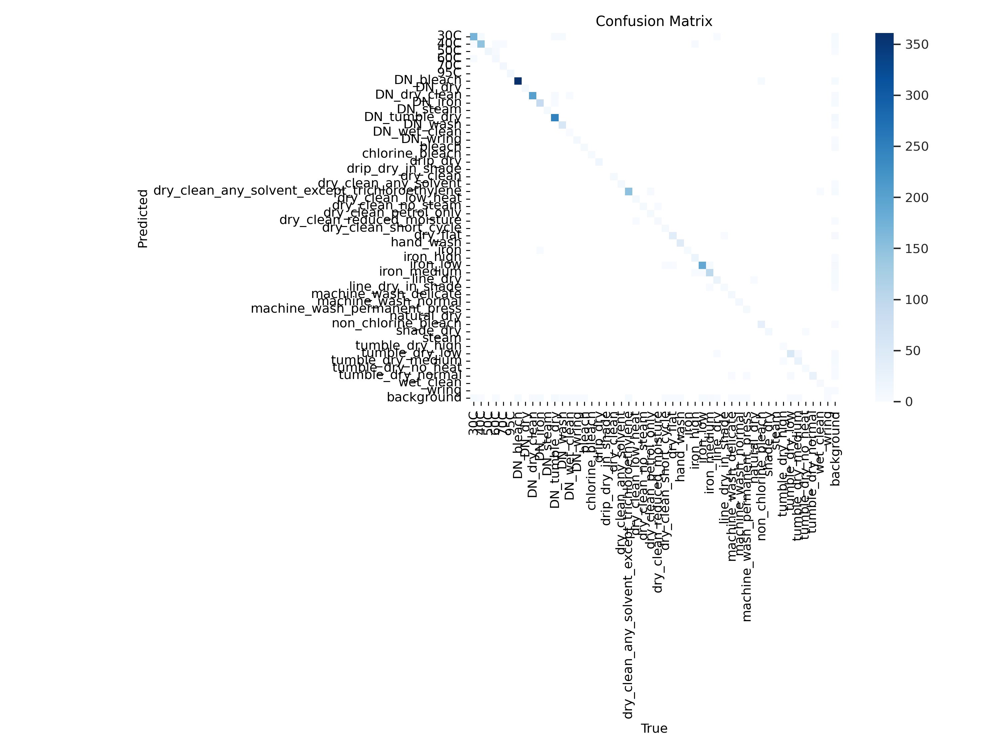

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=1000)

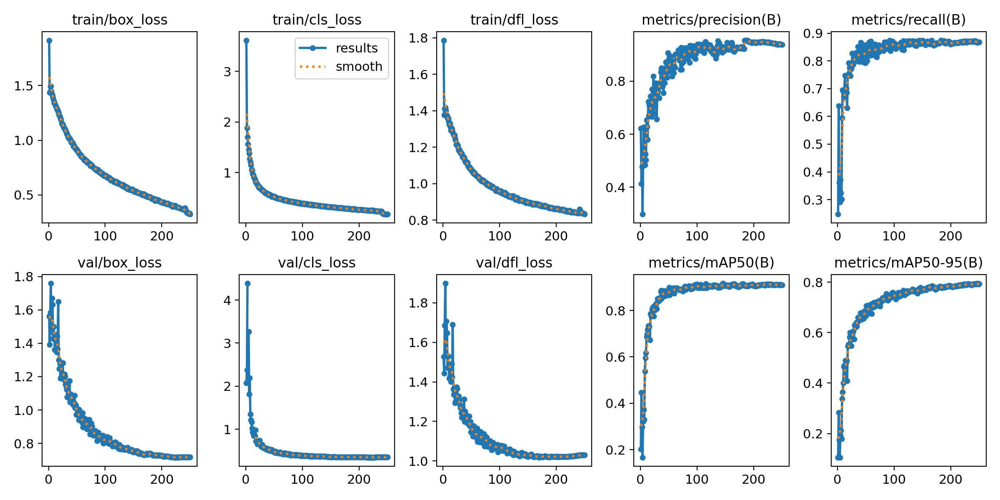

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/results.png', width=1000)

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

ds.classes

['30C',
 '40C',
 '50C',
 '60C',
 '70C',
 '95C',
 'DN_bleach',
 'DN_dry',
 'DN_dry_clean',
 'DN_iron',
 'DN_steam',
 'DN_tumble_dry',
 'DN_wash',
 'DN_wet_clean',
 'DN_wring',
 'bleach',
 'chlorine_bleach',
 'drip_dry',
 'drip_dry_in_shade',
 'dry_clean',
 'dry_clean_any_solvent',
 'dry_clean_any_solvent_except_trichloroethylene',
 'dry_clean_low_heat',
 'dry_clean_no_steam',
 'dry_clean_petrol_only',
 'dry_clean_reduced_moisture',
 'dry_clean_short_cycle',
 'dry_flat',
 'hand_wash',
 'iron',
 'iron_high',
 'iron_low',
 'iron_medium',
 'line_dry',
 'line_dry_in_shade',
 'machine_wash_delicate',
 'machine_wash_normal',
 'machine_wash_permanent_press',
 'natural_dry',
 'non_chlorine_bleach',
 'shade_dry',
 'steam',
 'tumble_dry_high',
 'tumble_dry_low',
 'tumble_dry_medium',
 'tumble_dry_no_heat',
 'tumble_dry_normal',
 'wet_clean',
 'wring']

In [ ]:
from supervision.metrics import MeanAveragePrecision

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)

    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()

In [ ]:
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)

mAP 50:95 0.7017601821164197
mAP 50 0.7890392171415332
mAP 75 0.7691521233330217


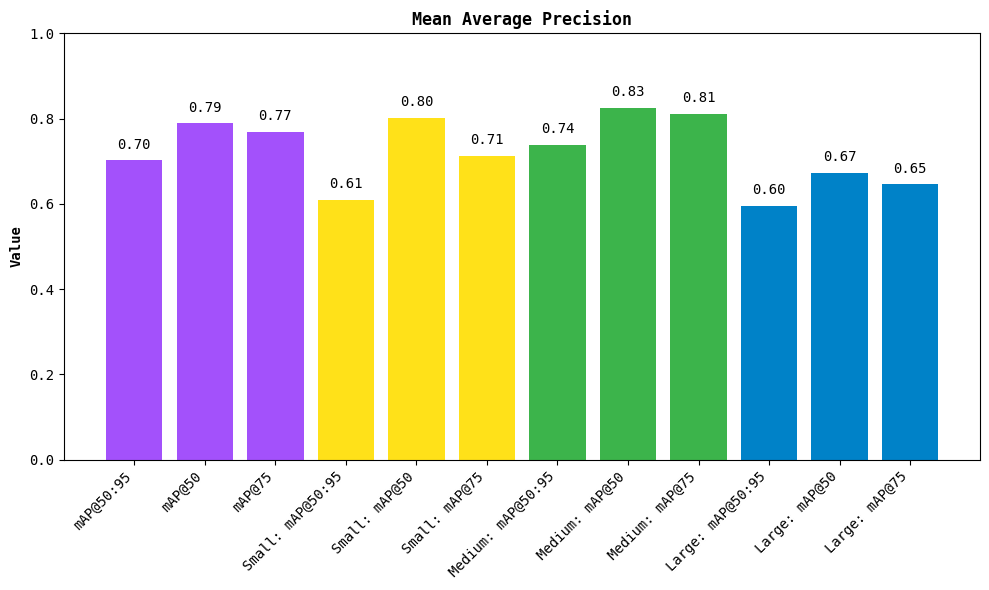

In [ ]:
map.plot()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Run inference with fine-tuned YOLOv12 model

In [ ]:
import supervision as sv

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml"
)

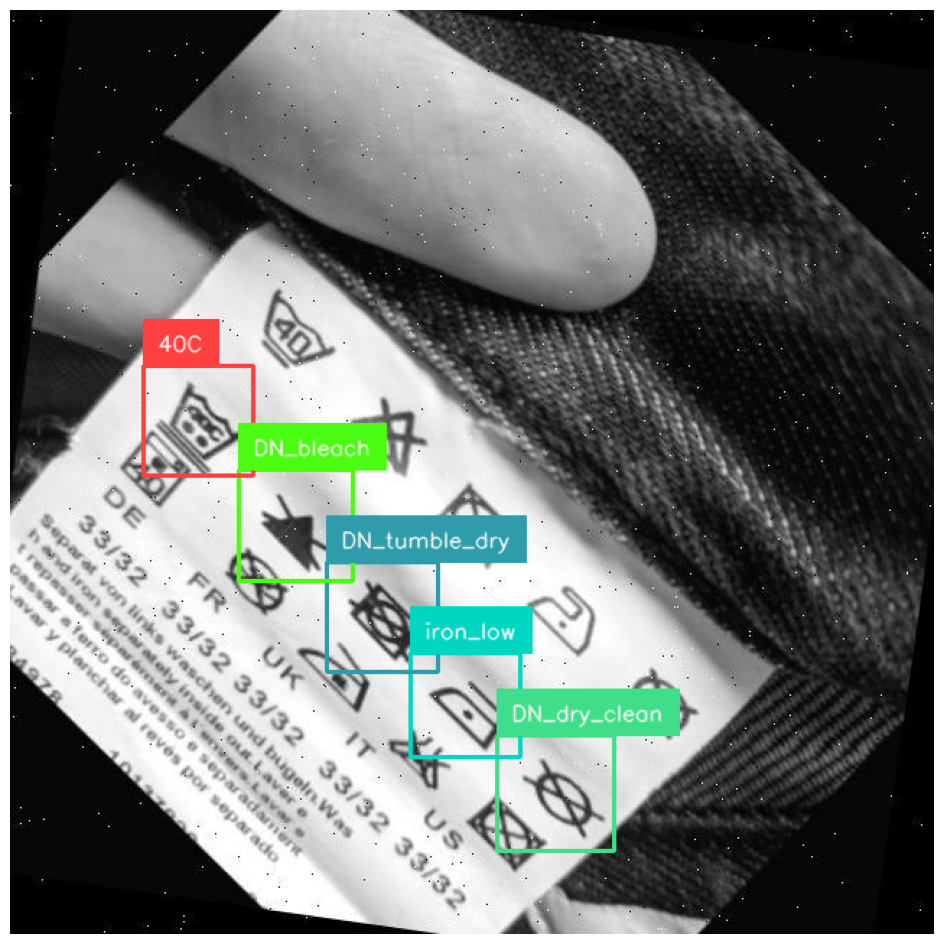

In [ ]:
import random

i = random.randint(0, len(ds))

image_path, image, target = ds[i]

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

sv.plot_image(annotated_image)

In [ ]:
!zip -r /content/content.zip /content

Streaming output truncated to the last 5000 lines.
  adding: content/wl2-1/train/images/img46_jpg.rf.1aab7a52f712d63179bc645b553cfc7c.jpg (deflated 1%)
  adding: content/wl2-1/train/images/istockphoto-1248252549-612x612_jpeg_jpg.rf.c18dcf364dfbaceb1b780759036f0bf6.jpg (deflated 7%)
  adding: content/wl2-1/train/images/test1_jpg.rf.1d98bbf8d649ae4acd09a112c63d118a.jpg (deflated 5%)
  adding: content/wl2-1/train/images/krimg1_jpg.rf.970c2ca27ab6c27f6ba2d02f91a81199.jpg (deflated 0%)
  adding: content/wl2-1/train/images/istockphoto-1092065154-612x612_jpeg_jpg.rf.54f0a1fabb8115d35d144ab6d09a8a6d.jpg (deflated 0%)
  adding: content/wl2-1/train/images/PXL_20221022_033709641_jpg.rf.343941ded17f3524c254111f1a61e50d.jpg (deflated 1%)
  adding: content/wl2-1/train/images/test42_jpg.rf.0670fd9c7906631fb7ee051679414021.jpg (deflated 0%)
  adding: content/wl2-1/train/images/img44_jpg.rf.7fd238bc75a1a314f524a2ac8b11c0a6.jpg (deflated 2%)
  adding: content/wl2-1/train/images/42_jpg.rf.a30295428d1e2b6

In [ ]:
from google.colab import files
files.download('/content/content.zip')

In [ ]:
from google.colab import files
files.upload()

Saving yolo12-250-64m-content.zip to yolo12-250-64m-content.zip


In [ ]:
!file yolo12-250-64m-content.zip

yolo12-250-64m-content.zip: Zip archive data, at least v1.0 to extract, compression method=store


In [ ]:
!unzip yolo12-250-64m-content.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/content/wl2-1/train/images/img84_jpg.rf.b8e9f00151864ccf1f94dc0980fdcf5b.jpg  
  inflating: /content/content/wl2-1/train/images/img46_jpg.rf.1aab7a52f712d63179bc645b553cfc7c.jpg  
  inflating: /content/content/wl2-1/train/images/istockphoto-1248252549-612x612_jpeg_jpg.rf.c18dcf364dfbaceb1b780759036f0bf6.jpg  
  inflating: /content/content/wl2-1/train/images/test1_jpg.rf.1d98bbf8d649ae4acd09a112c63d118a.jpg  
  inflating: /content/content/wl2-1/train/images/krimg1_jpg.rf.970c2ca27ab6c27f6ba2d02f91a81199.jpg  
  inflating: /content/content/wl2-1/train/images/istockphoto-1092065154-612x612_jpeg_jpg.rf.54f0a1fabb8115d35d144ab6d09a8a6d.jpg  
  inflating: /content/content/wl2-1/train/images/PXL_20221022_033709641_jpg.rf.343941ded17f3524c254111f1a61e50d.jpg  
  inflating: /content/content/wl2-1/train/images/test42_jpg.rf.0670fd9c7906631fb7ee051679414021.jpg  
  inflating: /content/content/wl2-1/train/images/img44_jpg.rf.

In [ ]:
model = YOLO("/content/content/runs/detect/train/weights/best.pt")

# Validate on the dataset
metrics = model.val(data="/content/content/wl2-1/data.yaml")

precision = metrics.box.mp  # mean precision
recall = metrics.box.mr     # mean recall

print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")

Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (AMD EPYC 7B12)
YOLOv12m summary (fused): 402 layers, 19,614,307 parameters, 0 gradients, 59.7 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 13.7MB/s]
val: Scanning /content/content/wl2-1/valid/labels... 352 images, 0 backgrounds, 0 corrupt: 100%|██████████| 352/352 [00:00<00:00, 845.83it/s]

val: New cache created: /content/content/wl2-1/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 62, len(boxes) = 2262. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [02:58<00:00,  8.12s/it]


                   all        352       2262       0.94      0.867      0.911      0.792
                   30C        152        176      0.962      0.966      0.984      0.835
                   40C        137        152      0.978      0.974      0.989      0.817
                   50C          8         15      0.911          1      0.995      0.927
                   60C          9         13      0.894      0.652      0.805      0.716
                   70C          6         11      0.983      0.909      0.952      0.898
                   95C          7         12      0.981          1      0.995      0.932
             DN_bleach        304        364      0.986      0.988      0.989      0.825
                DN_dry          6          6          1      0.936      0.995      0.929
          DN_dry_clean        177        204       0.99      0.985      0.991       0.83
               DN_iron         66         95      0.966      0.958      0.962       0.81
              DN_stea